# Viewgraph & Edge Quality Analysis
Post-hoc analysis of a GTSFM pipeline run.

Explores the MegaLoc similarity graph structure (connected components, bridge edges
at various thresholds) and edge quality metrics from reconstruction.

In [1]:
from pathlib import Path

# === CONFIGURE THESE ===
OUTPUT_ROOT = Path("../results")  # --output_root used for the pipeline run
DUBROVNIK_ROOT = Path("../dubrovnik")
IMAGES_DIR = Path("../dubrovnik/images")  # directory with source images
SIM_THRESHOLD = 0.3  # MegaLoc similarity threshold for viewgraph analysis

# Derived paths
EDGE_QUALITY_JSON = OUTPUT_ROOT / "edge_quality_report.json"
CLUSTER_TREE_PKL = OUTPUT_ROOT / "cluster_tree.pkl"
SIMILARITY_MATRIX_TXT = DUBROVNIK_ROOT / "similarity_matrix.txt"
TWO_VIEW_REPORT_JSON = OUTPUT_ROOT / "metrics" / "two_view_report_VIEWGRAPH_2VIEW_REPORT.json"

In [3]:
import glob as glob_mod
import json
import os
import pickle

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# --- Derive image filenames from IMAGES_DIR (matches OlssonLoader ordering) ---
IMG_EXTENSIONS = ["jpg", "jpeg", "png", "JPG", "JPEG", "PNG", "bmp", "tif", "tiff"]
image_paths = []
for ext in IMG_EXTENSIONS:
    image_paths.extend(glob_mod.glob(os.path.join(str(IMAGES_DIR), f"*.{ext}")))
image_paths = sorted(image_paths)
image_filenames = [os.path.basename(p) for p in image_paths]
print(f"Images found in {IMAGES_DIR}: {len(image_filenames)}")

# --- Load edge quality report (optional — not available before reconstruction) ---
edge_quality = {}
bad_edges = set()
metadata = None

if EDGE_QUALITY_JSON.exists():
    with open(EDGE_QUALITY_JSON) as f:
        report = json.load(f)

    # Override filenames from report if available (they match the pipeline run)
    # report_filenames = report.get("image_filenames", [])
    # if report_filenames:
    #     image_filenames = report_filenames
    #     print(f"  Overrode filenames from edge quality report ({len(image_filenames)} images)")

    for edge_str, stats in report["edge_quality"].items():
        i, j = map(int, edge_str.strip("()").split(","))
        edge_quality[(i, j)] = stats

    for s in report["bad_edges"]:
        i, j = map(int, s.strip("()").split(","))
        bad_edges.add((i, j))

    metadata = report["metadata"]
    print(f"Edge quality: {metadata['total_edges']} edges, {metadata['bad_edge_count']} bad, "
          f"{metadata['edges_with_no_tracks']} zero-track")
else:
    print(f"Edge quality report not found at {EDGE_QUALITY_JSON} (pre-reconstruction mode)")

# --- Load cluster tree (optional) ---
cluster_tree = None
if CLUSTER_TREE_PKL.exists():
    with open(CLUSTER_TREE_PKL, "rb") as f:
        cluster_tree = pickle.load(f)
    print(f"Cluster tree loaded ({len(list(cluster_tree.leaves()))} leaves)")
else:
    print(f"Cluster tree not found at {CLUSTER_TREE_PKL}")

# --- Load MegaLoc similarity matrix (upper-triangular, -inf on diagonal/lower) ---
similarity_matrix = None
if SIMILARITY_MATRIX_TXT.exists():
    similarity_matrix = np.loadtxt(SIMILARITY_MATRIX_TXT, delimiter=",")
    similarity_matrix = np.where(
        similarity_matrix == float("-inf"),
        similarity_matrix.T,
        similarity_matrix,
    )
    np.fill_diagonal(similarity_matrix, 0.0)
    print(f"Similarity matrix: {similarity_matrix.shape}")
else:
    print(f"Similarity matrix not found at {SIMILARITY_MATRIX_TXT}")

# --- Load two-view reports (optional) ---
two_view_match_counts = {}
if TWO_VIEW_REPORT_JSON.exists():
    with open(TWO_VIEW_REPORT_JSON) as f:
        two_view_reports = json.load(f)
    for r in two_view_reports:
        edge = (min(r["i1"], r["i2"]), max(r["i1"], r["i2"]))
        two_view_match_counts[edge] = r.get("num_inliers_est_model", 0)
    print(f"Two-view reports: {len(two_view_match_counts)} edges")
else:
    print(f"Two-view report not found at {TWO_VIEW_REPORT_JSON}")

Images found in ../dubrovnik/images: 6044
Edge quality: 485 edges, 2 bad, 0 zero-track
Cluster tree loaded (11 leaves)
Similarity matrix: (6044, 6044)
Two-view report not found at ../results/metrics/two_view_report_VIEWGRAPH_2VIEW_REPORT.json


## 1. Summary Statistics

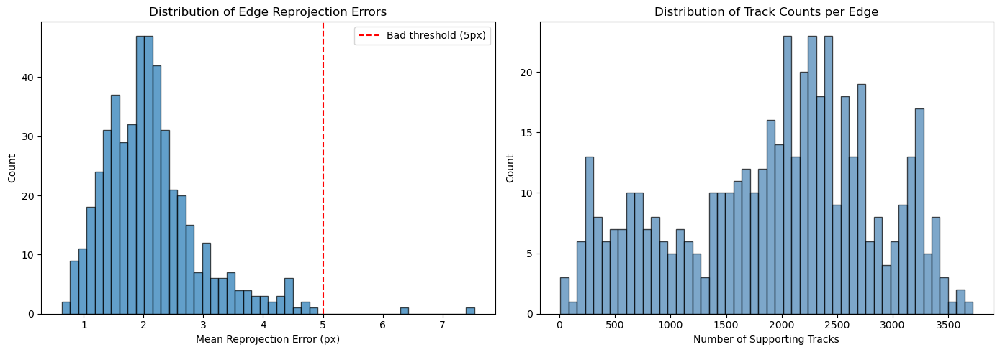

Mean reproj error:  2.13 px
Median reproj error: 2.02 px
Max reproj error:   7.53 px
Edges > 5px: 2 / 485
Edges > 3px: 60 / 485
Edges > 1px: 468 / 485


In [6]:
if not edge_quality:
    print("No edge quality data — skipping summary statistics (pre-reconstruction mode).")
else:
    errors = []
    track_counts = []
    for stats in edge_quality.values():
        val = stats["mean_reproj_error_px"]
        if val != "inf":
            errors.append(val)
        track_counts.append(stats["num_tracks"])

    errors = np.array(errors)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    ax = axes[0]
    ax.hist(errors, bins=50, edgecolor="black", alpha=0.7)
    ax.axvline(5.0, color="red", linestyle="--", label="Bad threshold (5px)")
    ax.set_xlabel("Mean Reprojection Error (px)")
    ax.set_ylabel("Count")
    ax.set_title("Distribution of Edge Reprojection Errors")
    ax.legend()

    ax = axes[1]
    ax.hist(track_counts, bins=50, edgecolor="black", alpha=0.7, color="steelblue")
    ax.set_xlabel("Number of Supporting Tracks")
    ax.set_ylabel("Count")
    ax.set_title("Distribution of Track Counts per Edge")

    plt.tight_layout()
    plt.show()

    print(f"Mean reproj error:  {np.mean(errors):.2f} px")
    print(f"Median reproj error: {np.median(errors):.2f} px")
    print(f"Max reproj error:   {np.max(errors):.2f} px")
    print(f"Edges > 5px: {np.sum(errors > 5.0)} / {len(errors)}")
    print(f"Edges > 3px: {np.sum(errors > 3.0)} / {len(errors)}")
    print(f"Edges > 1px: {np.sum(errors > 1.0)} / {len(errors)}")

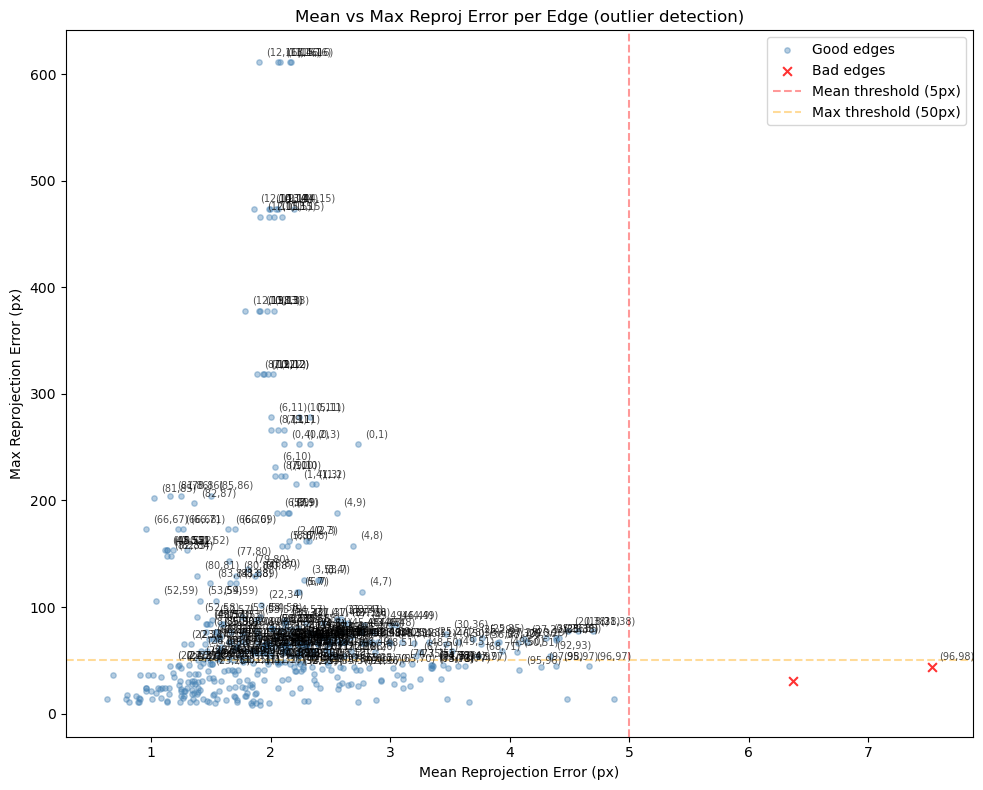

Edges with max > 50px: 281
Edges with max > 30px: 382
Edges with max > 20px: 426


In [7]:
if not edge_quality:
    print("No edge quality data — skipping scatter plot.")
else:
    mean_errors = []
    max_errors = []
    is_bad_flags = []
    edge_labels = []

    for (i, j), stats in edge_quality.items():
        mean_err = stats["mean_reproj_error_px"]
        max_err = stats["max_reproj_error_px"]
        if mean_err == "inf" or max_err == "inf":
            continue
        mean_errors.append(mean_err)
        max_errors.append(max_err)
        is_bad_flags.append((i, j) in bad_edges)
        edge_labels.append(f"({i},{j})")

    mean_errors = np.array(mean_errors)
    max_errors = np.array(max_errors)
    is_bad_flags = np.array(is_bad_flags)

    fig, ax = plt.subplots(figsize=(10, 8))
    good = ~is_bad_flags
    ax.scatter(mean_errors[good], max_errors[good], alpha=0.4, s=15, c="steelblue", label="Good edges")
    ax.scatter(mean_errors[is_bad_flags], max_errors[is_bad_flags], alpha=0.8, s=40, c="red", marker="x", label="Bad edges")

    ax.axvline(5.0, color="red", linestyle="--", alpha=0.4, label="Mean threshold (5px)")
    ax.axhline(50.0, color="orange", linestyle="--", alpha=0.4, label="Max threshold (50px)")

    for idx in np.where(max_errors > 40)[0]:
        ax.annotate(edge_labels[idx], (mean_errors[idx], max_errors[idx]),
                    fontsize=7, alpha=0.7, textcoords="offset points", xytext=(5, 5))

    ax.set_xlabel("Mean Reprojection Error (px)")
    ax.set_ylabel("Max Reprojection Error (px)")
    ax.set_title("Mean vs Max Reproj Error per Edge (outlier detection)")
    ax.legend()
    plt.tight_layout()
    plt.show()

    print(f"Edges with max > 50px: {np.sum(max_errors > 50)}")
    print(f"Edges with max > 30px: {np.sum(max_errors > 30)}")
    print(f"Edges with max > 20px: {np.sum(max_errors > 20)}")

In [ ]:
if not edge_quality:
    print("No edge quality data — skipping per-image outlier analysis.")
else:
    from collections import defaultdict

    image_max_errors = defaultdict(list)
    for (i, j), stats in edge_quality.items():
        max_err = stats["max_reproj_error_px"]
        if max_err == "inf":
            max_err = 100
        image_max_errors[i].append(max_err)
        image_max_errors[j].append(max_err)

    image_indices = sorted(image_max_errors.keys())
    worst_max = [max(image_max_errors[idx]) for idx in image_indices]
    mean_max = [np.mean(image_max_errors[idx]) for idx in image_indices]

    fig, ax = plt.subplots(figsize=(16, 5))
    ax.bar(image_indices, worst_max, alpha=0.6, color="coral", label="Worst max reproj error")
    ax.bar(image_indices, mean_max, alpha=0.6, color="steelblue", label="Mean of max errors")
    ax.axhline(50.0, color="orange", linestyle="--", alpha=0.6, label="Max threshold (50px)")
    ax.set_xlabel("Image Index")
    ax.set_ylabel("Max Reprojection Error (px)")
    ax.set_title("Per-Image Outlier Analysis: Which images have the worst tracks?")
    ax.legend()
    plt.tight_layout()
    plt.show()

    sorted_by_worst = sorted(zip(image_indices, worst_max), key=lambda x: x[1], reverse=True)
    print("Top 10 images by worst max reproj error:")
    for idx, err in sorted_by_worst[:10]:
        fname = image_filenames[idx] if idx < len(image_filenames) else f"image_{idx}"
        n_edges = len(image_max_errors[idx])
        print(f"  [{idx}] {fname}: max={err:.1f}px (across {n_edges} edges)")

## 2. Bad Edge Image Pairs
Showing the actual image pairs for the worst edges.

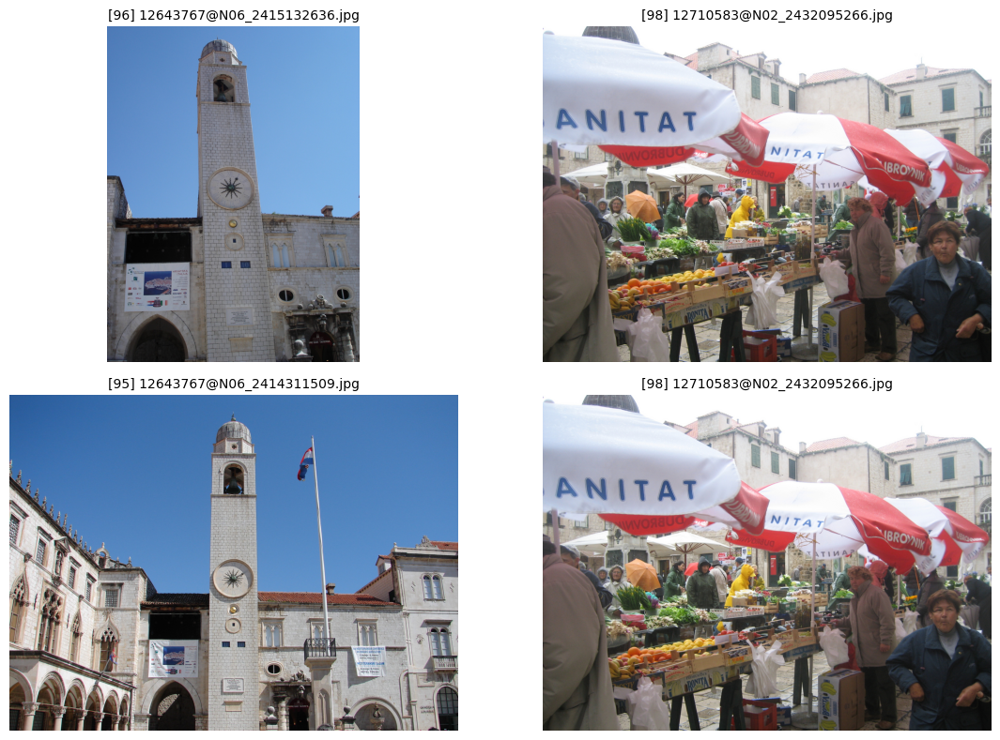

In [8]:
def get_fname(idx):
    """Get image filename from index."""
    if idx < len(image_filenames):
        return image_filenames[idx]
    return f"image_{idx:04d}.jpg"


def load_img(img_dir, fname):
    """Load image, trying common extensions if exact match fails."""
    path = img_dir / fname
    if path.exists():
        return np.array(Image.open(path))
    for ext in [".jpg", ".jpeg", ".png", ".JPG", ".PNG"]:
        candidate = img_dir / (Path(fname).stem + ext)
        if candidate.exists():
            return np.array(Image.open(candidate))
    print(f"  WARNING: Could not find {fname} in {img_dir}")
    return np.zeros((100, 100, 3), dtype=np.uint8)


if not edge_quality:
    print("No edge quality data — skipping bad edge image pairs.")
else:
    bad_edge_list = sorted(
        bad_edges,
        key=lambda e: edge_quality[e]["mean_reproj_error_px"]
        if edge_quality[e]["mean_reproj_error_px"] != "inf"
        else float("inf"),
        reverse=True,
    )

    n_show = min(len(bad_edge_list), 10)

    if n_show > 0:
        fig, axes = plt.subplots(n_show, 2, figsize=(12, 4 * n_show))
        if n_show == 1:
            axes = axes[np.newaxis, :]

        for row, (i, j) in enumerate(bad_edge_list[:n_show]):
            stats = edge_quality[(i, j)]
            fname_i, fname_j = get_fname(i), get_fname(j)

            axes[row, 0].imshow(load_img(IMAGES_DIR, fname_i))
            axes[row, 0].set_title(f"[{i}] {fname_i}", fontsize=10)
            axes[row, 0].axis("off")

            axes[row, 1].imshow(load_img(IMAGES_DIR, fname_j))
            axes[row, 1].set_title(f"[{j}] {fname_j}", fontsize=10)
            axes[row, 1].axis("off")

            err = stats["mean_reproj_error_px"]
            err_str = f"{err:.1f}" if err != "inf" else "inf"
            axes[row, 0].set_ylabel(
                f"({i},{j}) err={err_str}px tracks={stats['num_tracks']}",
                fontsize=10, color="red", rotation=0, labelpad=120, va="center",
            )

        plt.tight_layout()
        plt.show()
    else:
        print("No bad edges found!")

## 3. Bad Edges Per Cluster

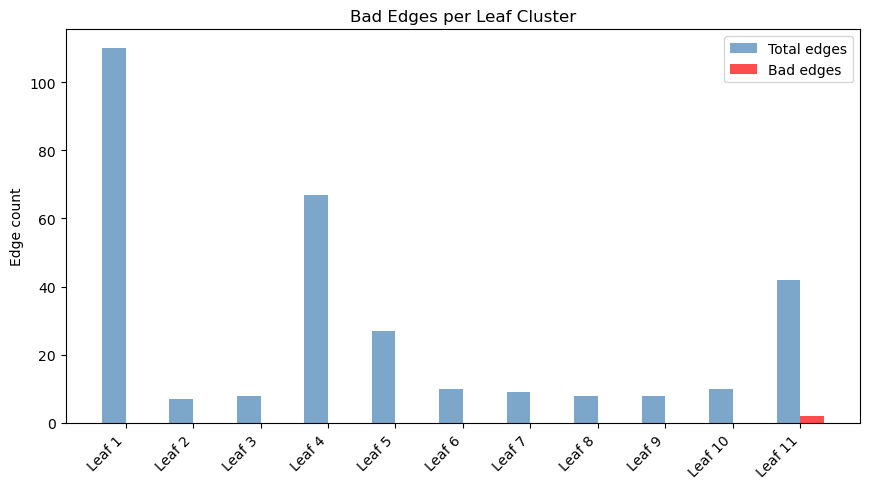

  Leaf 1: 0/110 bad (0%)
  Leaf 2: 0/7 bad (0%)
  Leaf 3: 0/8 bad (0%)
  Leaf 4: 0/67 bad (0%)
  Leaf 5: 0/27 bad (0%)
  Leaf 6: 0/10 bad (0%)
  Leaf 7: 0/9 bad (0%)
  Leaf 8: 0/8 bad (0%)
  Leaf 9: 0/8 bad (0%)
  Leaf 10: 0/10 bad (0%)
  Leaf 11: 2/42 bad (5%)


In [9]:
if cluster_tree is None:
    print("No cluster tree — skipping per-cluster analysis.")
elif not edge_quality:
    print("No edge quality data — skipping per-cluster analysis.")
else:
    leaves = list(cluster_tree.leaves())

    labels = []
    total_counts = []
    bad_counts = []

    for idx, leaf in enumerate(leaves):
        leaf_edges = set(leaf.value)
        n_bad = len(leaf_edges & bad_edges)
        labels.append(f"Leaf {idx + 1}")
        total_counts.append(len(leaf_edges))
        bad_counts.append(n_bad)

    fig, ax = plt.subplots(figsize=(max(8, len(labels) * 0.8), 5))
    x = np.arange(len(labels))
    width = 0.35
    ax.bar(x - width / 2, total_counts, width, label="Total edges", color="steelblue", alpha=0.7)
    ax.bar(x + width / 2, bad_counts, width, label="Bad edges", color="red", alpha=0.7)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_ylabel("Edge count")
    ax.set_title("Bad Edges per Leaf Cluster")
    ax.legend()
    plt.tight_layout()
    plt.show()

    for lbl, tot, bad in zip(labels, total_counts, bad_counts):
        pct = 100.0 * bad / tot if tot > 0 else 0
        print(f"  {lbl}: {bad}/{tot} bad ({pct:.0f}%)")

## 4. Viewgraph Connectivity Analysis
Build graphs from the MegaLoc similarity matrix at various thresholds.
At higher thresholds the graph fragments into disconnected components —
revealing "islands" of visually similar images. Understanding this structure
is essential before scaling to larger datasets like Dubrovnik.

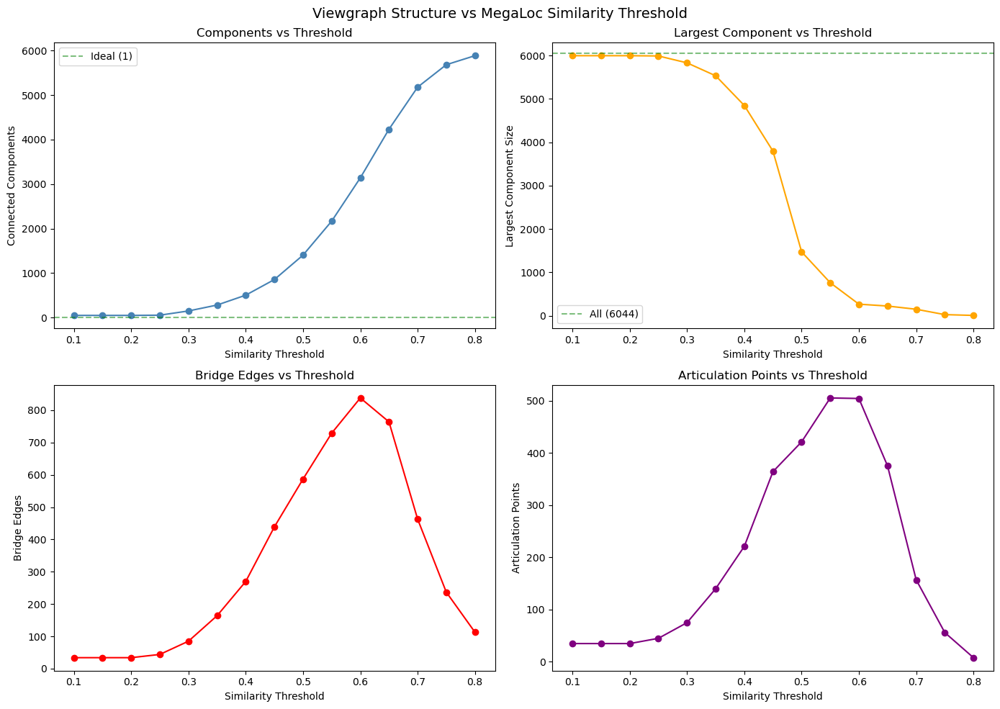

 Threshold   Edges  Comps  Largest  Bridges  Artic
--------------------------------------------------
      0.10  653172     48     5994       34     35
      0.15  653172     48     5994       34     35
      0.20  653172     48     5994       34     35
      0.25  614920     53     5988       44     45
      0.30  355086    148     5829       85     75
      0.35  223385    281     5531      164    140
      0.40  144544    503     4846      270    221
      0.45   91341    854     3794      439    364
      0.50   54138   1403     1473      587    421
      0.55   29150   2167      760      729    505
      0.60   13504   3140      266      838    504
      0.65    5141   4232      223      764    375
      0.70    1606   5178      149      463    157
      0.75     484   5682       25      237     56
      0.80     202   5885        7      113      8


In [4]:
import networkx as nx

SIM_THRESHOLD = 0.65

def build_sim_graph(sim_matrix, threshold):
    """Build an undirected graph from a similarity matrix at a given threshold."""
    G = nx.Graph()
    n = sim_matrix.shape[0]
    G.add_nodes_from(range(n))
    for i in range(n):
        for j in range(i + 1, n):
            if sim_matrix[i, j] >= threshold:
                G.add_edge(i, j, weight=float(sim_matrix[i, j]))
    return G

if similarity_matrix is not None:
    thresholds = np.arange(0.1, 0.85, 0.05)
    n_components_list = []
    largest_comp_list = []
    n_bridges_list = []
    n_artic_list = []
    n_edges_list = []

    n_images = similarity_matrix.shape[0]

    for t in thresholds:
        G = build_sim_graph(similarity_matrix, t)
        comps = list(nx.connected_components(G))
        n_components_list.append(len(comps))
        largest_comp_list.append(max(len(c) for c in comps) if comps else 0)
        n_bridges_list.append(len(list(nx.bridges(G))))
        n_artic_list.append(len(list(nx.articulation_points(G))))
        n_edges_list.append(G.number_of_edges())

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    axes[0, 0].plot(thresholds, n_components_list, "o-", color="steelblue")
    axes[0, 0].set_xlabel("Similarity Threshold")
    axes[0, 0].set_ylabel("Connected Components")
    axes[0, 0].set_title("Components vs Threshold")
    axes[0, 0].axhline(1, color="green", linestyle="--", alpha=0.5, label="Ideal (1)")
    axes[0, 0].legend()

    axes[0, 1].plot(thresholds, largest_comp_list, "o-", color="orange")
    axes[0, 1].axhline(n_images, color="green", linestyle="--", alpha=0.5, label=f"All ({n_images})")
    axes[0, 1].set_xlabel("Similarity Threshold")
    axes[0, 1].set_ylabel("Largest Component Size")
    axes[0, 1].set_title("Largest Component vs Threshold")
    axes[0, 1].legend()

    axes[1, 0].plot(thresholds, n_bridges_list, "o-", color="red")
    axes[1, 0].set_xlabel("Similarity Threshold")
    axes[1, 0].set_ylabel("Bridge Edges")
    axes[1, 0].set_title("Bridge Edges vs Threshold")

    axes[1, 1].plot(thresholds, n_artic_list, "o-", color="purple")
    axes[1, 1].set_xlabel("Similarity Threshold")
    axes[1, 1].set_ylabel("Articulation Points")
    axes[1, 1].set_title("Articulation Points vs Threshold")

    plt.suptitle("Viewgraph Structure vs MegaLoc Similarity Threshold", fontsize=14)
    plt.tight_layout()
    plt.show()

    print(f"{'Threshold':>10} {'Edges':>7} {'Comps':>6} {'Largest':>8} {'Bridges':>8} {'Artic':>6}")
    print("-" * 50)
    for t, e, c, l, b, a in zip(thresholds, n_edges_list, n_components_list, largest_comp_list, n_bridges_list, n_artic_list):
        print(f"{t:>10.2f} {e:>7d} {c:>6d} {l:>8d} {b:>8d} {a:>6d}")
else:
    print("No similarity matrix available — skipping threshold sweep.")

Similarity threshold: 0.65
Edges in graph: 6378
Connected components: 4001
Component sizes: [233, 162, 128, 116, 68, 49, 47, 41, 34, 34, 33, 29, 29, 29, 26, 25, 24, 23, 23, 22, 22, 20, 18, 18, 16, 15, 14, 13, 13, 12, 12, 11, 11, 10, 10, 10, 10, 10, 9, 9, 9, 9, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

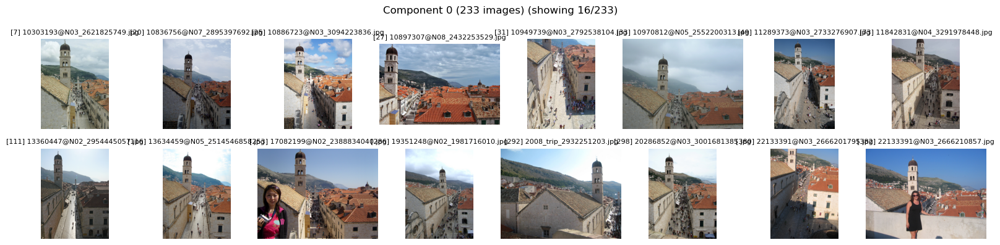

  Component 0: 7 (10303193@N03_2621825749.jpg), 20 (10836756@N07_2895397692.jpg), 25 (10886723@N03_3094223836.jpg), 27 (10897307@N08_2432253529.jpg), 31 (10949739@N03_2792538104.jpg), 33 (10970812@N05_2552200313.jpg), 49 (11289373@N03_2733276907.jpg), 73 (11842831@N04_3291978448.jpg), 111 (13360447@N02_2954445057.jpg), 116 (13634459@N05_2514546858.jpg) ... +223 more


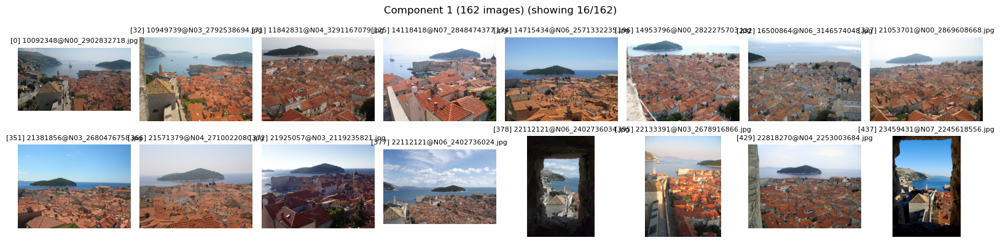

  Component 1: 0 (10092348@N00_2902832718.jpg), 32 (10949739@N03_2792538694.jpg), 71 (11842831@N04_3291167079.jpg), 125 (14118418@N07_2848474377.jpg), 174 (14715434@N06_2571332235.jpg), 196 (14953796@N00_2822275703.jpg), 232 (16500864@N06_3146574048.jpg), 327 (21053701@N00_2869608668.jpg), 351 (21381856@N03_2680476758.jpg), 366 (21571379@N04_2710022080.jpg) ... +152 more


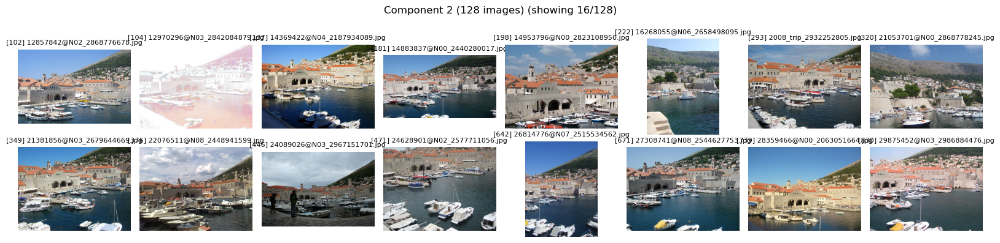

  Component 2: 102 (12857842@N02_2868776678.jpg), 104 (12970296@N03_2842084879.jpg), 137 (14369422@N04_2187934089.jpg), 181 (14883837@N00_2440280017.jpg), 198 (14953796@N00_2823108950.jpg), 222 (16268055@N06_2658498095.jpg), 293 (2008_trip_2932252805.jpg), 320 (21053701@N00_2868778245.jpg), 349 (21381856@N03_2679644669.jpg), 376 (22076511@N08_2448941599.jpg) ... +118 more


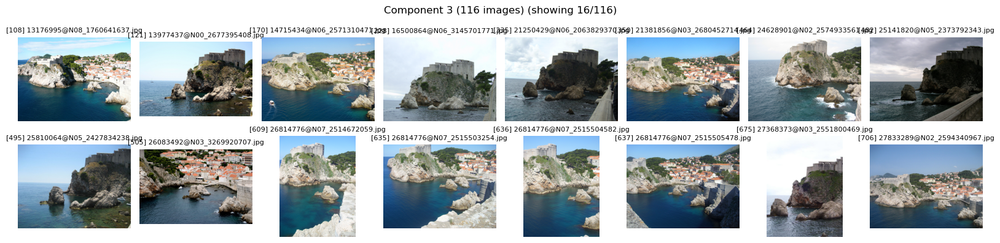

  Component 3: 108 (13176995@N08_1760641637.jpg), 121 (13977437@N00_2677395408.jpg), 170 (14715434@N06_2571310471.jpg), 228 (16500864@N06_3145701771.jpg), 335 (21250429@N06_2063829370.jpg), 350 (21381856@N03_2680452714.jpg), 464 (24628901@N02_2574933561.jpg), 482 (25141820@N05_2373792343.jpg), 495 (25810064@N05_2427834238.jpg), 505 (26083492@N03_3269920707.jpg) ... +106 more


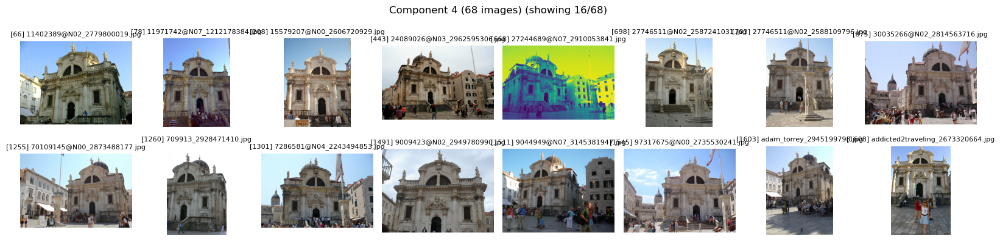

  Component 4: 66 (11402389@N02_2779800019.jpg), 78 (11971742@N07_1212178384.jpg), 208 (15579207@N00_2606720929.jpg), 443 (24089026@N03_2962595306.jpg), 668 (27244689@N07_2910053841.jpg), 698 (27746511@N02_2587241031.jpg), 703 (27746511@N02_2588109796.jpg), 875 (30035266@N02_2814563716.jpg), 1255 (70109145@N00_2873488177.jpg), 1260 (709913_2928471410.jpg) ... +58 more


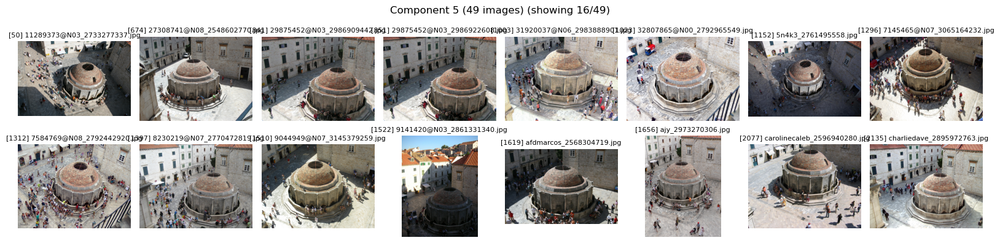

  Component 5: 50 (11289373@N03_2733277337.jpg), 674 (27308741@N08_2548602770.jpg), 841 (29875452@N03_2986909442.jpg), 851 (29875452@N03_2986922608.jpg), 1003 (31920037@N06_2983888901.jpg), 1023 (32807865@N00_2792965549.jpg), 1152 (5n4k3_2761495558.jpg), 1296 (7145465@N07_3065164232.jpg), 1312 (7584769@N08_2792442920.jpg), 1397 (8230219@N07_2770472819.jpg) ... +39 more


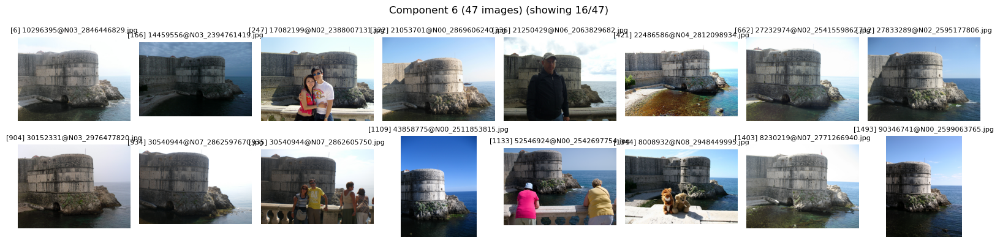

  Component 6: 6 (10296395@N03_2846446829.jpg), 166 (14459556@N03_2394761419.jpg), 247 (17082199@N02_2388007131.jpg), 322 (21053701@N00_2869606240.jpg), 336 (21250429@N06_2063829682.jpg), 421 (22486586@N04_2812098934.jpg), 662 (27232974@N02_2541559862.jpg), 712 (27833289@N02_2595177806.jpg), 904 (30152331@N03_2976477820.jpg), 934 (30540944@N07_2862597670.jpg) ... +37 more


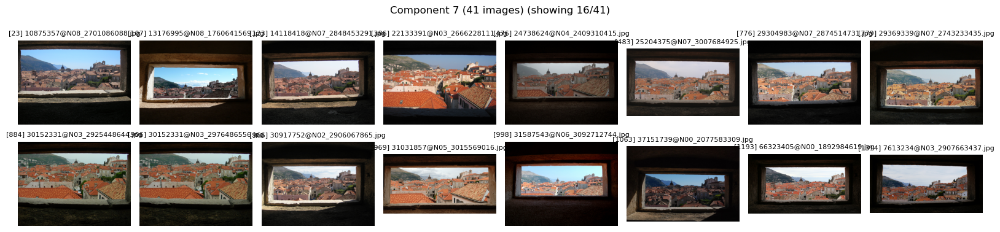

  Component 7: 23 (10875357@N08_2701086088.jpg), 107 (13176995@N08_1760641569.jpg), 123 (14118418@N07_2848453291.jpg), 386 (22133391@N03_2666228111.jpg), 476 (24738624@N04_2409310415.jpg), 483 (25204375@N07_3007684925.jpg), 776 (29304983@N07_2874514731.jpg), 779 (29369339@N07_2743233435.jpg), 884 (30152331@N03_2925448644.jpg), 906 (30152331@N03_2976486556.jpg) ... +31 more

  ... 3993 more components not shown


In [10]:
# Connected components at the chosen SIM_THRESHOLD — show images in each component
if similarity_matrix is not None:
    G_thresh = build_sim_graph(similarity_matrix, SIM_THRESHOLD)
    components = sorted(nx.connected_components(G_thresh), key=len, reverse=True)

    print(f"Similarity threshold: {SIM_THRESHOLD}")
    print(f"Edges in graph: {G_thresh.number_of_edges()}")
    print(f"Connected components: {len(components)}")
    print(f"Component sizes: {[len(c) for c in components]}")
    print()

    MAX_COMPONENTS_TO_SHOW = 8
    MAX_IMAGES_PER_COMPONENT = 16

    for comp_idx, comp_nodes in enumerate(components[:MAX_COMPONENTS_TO_SHOW]):
        sorted_nodes = sorted(comp_nodes)
        n = min(len(sorted_nodes), MAX_IMAGES_PER_COMPONENT)
        display_nodes = sorted_nodes[:n]
        cols = min(n, 8)
        rows = (n + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
        if rows * cols == 1:
            axes = np.array([axes])
        axes = np.array(axes).reshape(-1)

        for i, img_idx in enumerate(display_nodes):
            fname = get_fname(img_idx)
            axes[i].imshow(load_img(IMAGES_DIR, fname))
            axes[i].set_title(f"[{img_idx}] {fname}", fontsize=8)
            axes[i].axis("off")

        for j in range(n, len(axes)):
            axes[j].axis("off")

        suffix = f" (showing {n}/{len(sorted_nodes)})" if len(sorted_nodes) > n else ""
        fig.suptitle(f"Component {comp_idx} ({len(sorted_nodes)} images){suffix}", fontsize=12)
        plt.tight_layout()
        plt.show()

        # Print node list
        if image_filenames:
            labels = [f"{idx} ({image_filenames[idx]})" if idx < len(image_filenames) else str(idx) for idx in sorted_nodes[:10]]
        else:
            labels = [str(idx) for idx in sorted_nodes[:10]]
        trail = f" ... +{len(sorted_nodes) - 10} more" if len(sorted_nodes) > 10 else ""
        print(f"  Component {comp_idx}: {', '.join(labels)}{trail}")

    if len(components) > MAX_COMPONENTS_TO_SHOW:
        print(f"\n  ... {len(components) - MAX_COMPONENTS_TO_SHOW} more components not shown")
else:
    print("No similarity matrix available.")

## 5. Bridge Edges & Articulation Points
**Bridge edges**: edges whose removal would disconnect the viewgraph at the current
similarity threshold. These are the critical weak links — if reconstruction fails
on these edges, the graph fragments.

**Articulation points**: nodes whose removal would disconnect the graph. These images
are load-bearing — they're the only visual link between two regions of the scene.

Similarity threshold: 0.65
Bridge edges: 806
Articulation points: 430

      Edge    Sim  Side A  Side B  Tracks   Reproj
----------------------------------------------------
  (39,40)  1.000       1       1    3236      2.9
  (257,270)  1.000       1       1     N/A      N/A
  (262,267)  1.000       1       1     N/A      N/A
  (834,4789)  1.000       1       1     N/A      N/A
  (835,4790)  1.000       1       1     N/A      N/A
  (837,4791)  1.000       1       1     N/A      N/A
  (880,905)  1.000       1       1     N/A      N/A
  (881,910)  1.000       1       1     N/A      N/A
  (882,902)  1.000       1       1     N/A      N/A
  (885,907)  1.000       1       1     N/A      N/A
  (889,898)  1.000       1       1     N/A      N/A
  (890,911)  1.000       1       1     N/A      N/A
  (1025,1034)  1.000       1       1     N/A      N/A
  (1392,1915)  1.000       1       1     N/A      N/A
  (1393,1913)  1.000       1       1     N/A      N/A
  (1849,1854)  1.000       1       1  

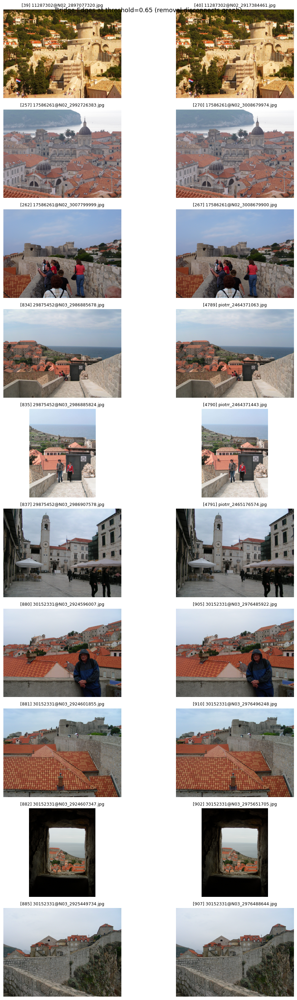


Articulation points (430):
  [7] 10303193@N03_2621825749.jpg: degree=26, removal creates 4002 components
  [50] 11289373@N03_2733277337.jpg: degree=2, removal creates 4002 components
  [57] 11289373@N03_2733294975.jpg: degree=2, removal creates 4002 components
  [61] 11289373@N03_2734111552.jpg: degree=2, removal creates 4002 components
  [63] 11289373@N03_2734124994.jpg: degree=3, removal creates 4003 components
  [72] 11842831@N04_3291177687.jpg: degree=4, removal creates 4002 components
  [78] 11971742@N07_1212178384.jpg: degree=2, removal creates 4002 components
  [96] 12643767@N06_2415132636.jpg: degree=2, removal creates 4002 components
  [103] 12970296@N03_2842084871.jpg: degree=8, removal creates 4002 components
  [123] 14118418@N07_2848453291.jpg: degree=11, removal creates 4002 components
  [130] 14214263@N04_2535233601.jpg: degree=4, removal creates 4002 components
  [134] 14214263@N04_2536088150.jpg: degree=3, removal creates 4002 components
  [158] 14459556@N03_2393723134

In [11]:
# Bridge edges and articulation points at SIM_THRESHOLD
if similarity_matrix is not None:
    G_thresh = build_sim_graph(similarity_matrix, SIM_THRESHOLD)
    bridge_edges = sorted(nx.bridges(G_thresh))
    artic_points = sorted(nx.articulation_points(G_thresh))

    print(f"Similarity threshold: {SIM_THRESHOLD}")
    print(f"Bridge edges: {len(bridge_edges)}")
    print(f"Articulation points: {len(artic_points)}")
    print()

    # --- Bridge edges table ---
    if bridge_edges:
        # For each bridge, compute the component sizes on each side if removed
        bridge_info = []
        for u, v in bridge_edges:
            sim_score = float(similarity_matrix[u, v])
            eq = edge_quality.get((min(u, v), max(u, v)), {})
            # Compute split sizes: remove edge, check components of u and v
            G_test = G_thresh.copy()
            G_test.remove_edge(u, v)
            comp_u = nx.node_connected_component(G_test, u)
            comp_v = nx.node_connected_component(G_test, v)
            bridge_info.append({
                "edge": (u, v),
                "sim": sim_score,
                "side_a": len(comp_u),
                "side_b": len(comp_v),
                "num_tracks": eq.get("num_tracks", None),
                "mean_reproj": eq.get("mean_reproj_error_px", None),
            })

        # Sort by similarity descending (highest-quality bridges first)
        bridge_info.sort(key=lambda x: x["sim"], reverse=True)

        print(f"{'Edge':>10} {'Sim':>6} {'Side A':>7} {'Side B':>7} {'Tracks':>7} {'Reproj':>8}")
        print("-" * 52)
        for b in bridge_info:
            u, v = b["edge"]
            tracks_str = str(b["num_tracks"]) if b["num_tracks"] is not None else "N/A"
            reproj = b["mean_reproj"]
            reproj_str = f"{reproj:.1f}" if isinstance(reproj, (int, float)) and reproj != float("inf") else (str(reproj) if reproj is not None else "N/A")
            print(f"  ({u:>2},{v:>2}) {b['sim']:>6.3f} {b['side_a']:>7d} {b['side_b']:>7d} {tracks_str:>7} {reproj_str:>8}")
        print()

        # Show image pairs for bridge edges (up to 10)
        n_show = min(len(bridge_info), 10)
        fig, axes = plt.subplots(n_show, 2, figsize=(12, 3 * n_show))
        if n_show == 1:
            axes = axes[np.newaxis, :]

        for row, b in enumerate(bridge_info[:n_show]):
            u, v = b["edge"]
            fname_u, fname_v = get_fname(u), get_fname(v)

            axes[row, 0].imshow(load_img(IMAGES_DIR, fname_u))
            axes[row, 0].set_title(f"[{u}] {fname_u}", fontsize=9)
            axes[row, 0].axis("off")

            axes[row, 1].imshow(load_img(IMAGES_DIR, fname_v))
            axes[row, 1].set_title(f"[{v}] {fname_v}", fontsize=9)
            axes[row, 1].axis("off")

            label = f"({u},{v}) sim={b['sim']:.3f}, splits {b['side_a']} | {b['side_b']}"
            axes[row, 0].set_ylabel(label, fontsize=9, color="red", rotation=0, labelpad=140, va="center")

        fig.suptitle(f"Bridge Edges at threshold={SIM_THRESHOLD} (removal disconnects graph)", fontsize=13)
        plt.tight_layout()
        plt.show()
    else:
        print("No bridge edges found (graph is 2-edge-connected).")

    # --- Articulation points ---
    if artic_points:
        print(f"\nArticulation points ({len(artic_points)}):")
        for node in artic_points:
            fname = get_fname(node)
            degree = G_thresh.degree(node)
            # Find how many components result from removing this node
            G_test = G_thresh.copy()
            G_test.remove_node(node)
            n_comps_after = nx.number_connected_components(G_test)
            print(f"  [{node}] {fname}: degree={degree}, removal creates {n_comps_after} components")
    else:
        print("\nNo articulation points (graph is biconnected).")
else:
    print("No similarity matrix available.")